### <b><H1 style = color:#2ecc71;background-color:#145a32;>SAMSUNG SALES PREDICTION MODEL</H1></b>


In [42]:
import pandas as pd 
import numpy as np 
import seaborn as sns 
import matplotlib.pyplot as plt 
import plotly.express as px 
from sklearn.model_selection import train_test_split
from sklearn.feature_selection import SequentialFeatureSelector,SelectKBest,chi2
from sklearn.preprocessing import StandardScaler , OrdinalEncoder,OneHotEncoder,LabelEncoder,FunctionTransformer,RobustScaler
from sklearn.linear_model import LogisticRegression
from sklearn.linear_model import LinearRegression, Ridge, Lasso,ElasticNet
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from xgboost import XGBRegressor
from sklearn.svm import SVR
import warnings
warnings.filterwarnings('ignore')
import json

In [2]:
df = pd.read_excel('Samsung_Sales_Dataset.xlsx')
df

,Year,Quarter,Product Model,5G Capability,Units Sold,Revenue ($),Market Share (%),Regional 5G Coverage (%),5G Subscribers (millions),Avg 5G Speed (Mbps),Preference for 5G (%),Region
0,2019,Q1,Galaxy S10,No,26396,4.212951e+06,1.04,57.36,39.55,293.10,55.87,Asia-Pacific
1,2019,Q1,Galaxy Note10,No,25671,7.240266e+06,2.82,85.80,42.58,67.46,37.26,Latin America
2,2019,Q1,Galaxy S20,No,16573,2.560833e+07,-0.03,47.02,3.78,77.25,84.66,Middle East & Africa
3,2019,Q1,Galaxy Note20,No,7177,2.198442e+07,0.84,25.70,23.41,105.27,40.03,North America
4,2019,Q1,Galaxy S21,No,45633,1.634244e+07,2.36,89.13,44.43,206.17,76.88,Latin America
...,...,...,...,...,...,...,...,...,...,...,...,...
995,2023,Q4,Galaxy S22 5G,Yes,36216,2.995937e+07,3.82,70.59,46.92,177.43,63.86,Latin America
996,2022,Q2,Galaxy S21,No,33806,2.369938e+07,-0.23,77.31,47.51,129.70,78.41,North America
997,2022,Q1,Galaxy S10,No,23678,2.330203e+07,0.58,45.61,43.79,156.56,72.06,Europe
998,2023,Q4,Galaxy Note10,No,35697,1.946256e+07,2.49,36.55,36.44,236.39,47.11,North America


<h1 style="color:red; text-align:center; background-color:pink">DATA ANALYSIS</h1>


In [3]:
df.isnull().mean()*100

Year                         0.0
Quarter                      0.0
Product Model                0.0
5G Capability                0.0
Units Sold                   0.0
Revenue ($)                  0.0
Market Share (%)             0.0
Regional 5G Coverage (%)     0.0
5G Subscribers (millions)    0.0
Avg 5G Speed (Mbps)          0.0
Preference for 5G (%)        0.0
Region                       0.0
dtype: float64

In [4]:
df.describe()

,Year,Units Sold,Revenue ($),Market Share (%),Regional 5G Coverage (%),5G Subscribers (millions),Avg 5G Speed (Mbps),Preference for 5G (%)
count,1000.000000,1000.000000,1.000000e+03,1000.000000,1000.000000,1000.000000,1000.000000,1000.00000
mean,2021.456000,32842.990000,3.019733e+07,3.723570,66.889720,30.152080,179.225560,67.14291
std,1.700281,16039.770572,1.837941e+07,1.991108,19.254095,14.537781,70.470934,15.75925
min,2019.000000,5309.000000,2.987436e+06,-0.490000,25.340000,-0.890000,50.370000,37.14000
25%,2020.000000,19327.250000,1.460749e+07,2.635000,50.400000,18.412500,120.410000,53.26750
50%,2021.000000,33689.000000,2.801200e+07,3.760000,67.050000,29.915000,177.390000,66.96000
75%,2023.000000,43911.000000,4.180391e+07,5.282500,83.210000,44.360000,238.860000,80.99000
max,2024.000000,64883.000000,8.426494e+07,6.950000,103.920000,54.940000,298.700000,94.84000


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 12 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Year                       1000 non-null   int64  
 1   Quarter                    1000 non-null   object 
 2   Product Model              1000 non-null   object 
 3   5G Capability              1000 non-null   object 
 4   Units Sold                 1000 non-null   int64  
 5   Revenue ($)                1000 non-null   float64
 6   Market Share (%)           1000 non-null   float64
 7   Regional 5G Coverage (%)   1000 non-null   float64
 8   5G Subscribers (millions)  1000 non-null   float64
 9   Avg 5G Speed (Mbps)        1000 non-null   float64
 10  Preference for 5G (%)      1000 non-null   float64
 11  Region                     1000 non-null   object 
dtypes: float64(6), int64(2), object(4)
memory usage: 93.9+ KB


In [6]:
import  sheryanalysis as sh
sh.analyze(df)



🔍 Basic Analysis Report
------------------------------------------------------------
📏 Shape: (1000, 12)
🧱 Columns: ['Year', 'Quarter', 'Product Model', '5G Capability', 'Units Sold', 'Revenue ($)', 'Market Share (%)', 'Regional 5G Coverage (%)', '5G Subscribers (millions)', 'Avg 5G Speed (Mbps)', 'Preference for 5G (%)', 'Region']

✅ No null values found

🔠 Categorical Columns: ['Year', 'Quarter', 'Product Model', '5G Capability', 'Region']

🔢 Numerical Columns: ['Units Sold', 'Revenue ($)', 'Market Share (%)', 'Regional 5G Coverage (%)', '5G Subscribers (millions)', 'Avg 5G Speed (Mbps)', 'Preference for 5G (%)']


{'shape': (1000, 12),
 'columns': ['Year',
  'Quarter',
  'Product Model',
  '5G Capability',
  'Units Sold',
  'Revenue ($)',
  'Market Share (%)',
  'Regional 5G Coverage (%)',
  '5G Subscribers (millions)',
  'Avg 5G Speed (Mbps)',
  'Preference for 5G (%)',
  'Region'],
 'dtypes': {'Year': dtype('int64'),
  'Quarter': dtype('O'),
  'Product Model': dtype('O'),
  '5G Capability': dtype('O'),
  'Units Sold': dtype('int64'),
  'Revenue ($)': dtype('float64'),
  'Market Share (%)': dtype('float64'),
  'Regional 5G Coverage (%)': dtype('float64'),
  '5G Subscribers (millions)': dtype('float64'),
  'Avg 5G Speed (Mbps)': dtype('float64'),
  'Preference for 5G (%)': dtype('float64'),
  'Region': dtype('O')},
 'null_counts': {'Year': 0,
  'Quarter': 0,
  'Product Model': 0,
  '5G Capability': 0,
  'Units Sold': 0,
  'Revenue ($)': 0,
  'Market Share (%)': 0,
  'Regional 5G Coverage (%)': 0,
  '5G Subscribers (millions)': 0,
  'Avg 5G Speed (Mbps)': 0,
  'Preference for 5G (%)': 0,
  'Regio

In [ ]:
from ydata_profiling import ProfileReport
from IPython.display import display

dataset = pd.read_excel('Samsung_Sales_Dataset.xlsx')
data = ProfileReport(dataset,title = "Samsung dataset ",explorative=True)
file = data.to_file('samsung.html')
display(data)
# its file path C:\Users\Sarthak jain\OneDrive\machineLearningFolder\samsung.html


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

100%|██████████| 12/12 [00:00<00:00, 155.64it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

In [11]:
df.duplicated()

0      False
1      False
2      False
3      False
4      False
       ...  
995     True
996     True
997     True
998     True
999     True
Length: 1000, dtype: bool

In [ ]:
df.shape,df.ndim,df.columns


((1000, 12), 2)

In [12]:
df.columns

Index(['Year', 'Quarter', 'Product Model', '5G Capability', 'Units Sold',
       'Revenue ($)', 'Market Share (%)', 'Regional 5G Coverage (%)',
       '5G Subscribers (millions)', 'Avg 5G Speed (Mbps)',
       'Preference for 5G (%)', 'Region'],
      dtype='object')

In [9]:
num_cols = df.select_dtypes(include=["int64", "float64"]).columns
cat_cols = df.select_dtypes(include=["object"]).columns

print("Numerical Columns:", num_cols)
print("Categorical Columns:", cat_cols)


Numerical Columns: Index(['Year', 'Units Sold', 'Revenue ($)', 'Market Share (%)',
       'Regional 5G Coverage (%)', '5G Subscribers (millions)',
       'Avg 5G Speed (Mbps)', 'Preference for 5G (%)'],
      dtype='object')
Categorical Columns: Index(['Quarter', 'Product Model', '5G Capability', 'Region'], dtype='object')


<h1 style="color:GREEN; text-align:center;">EDA</h1>


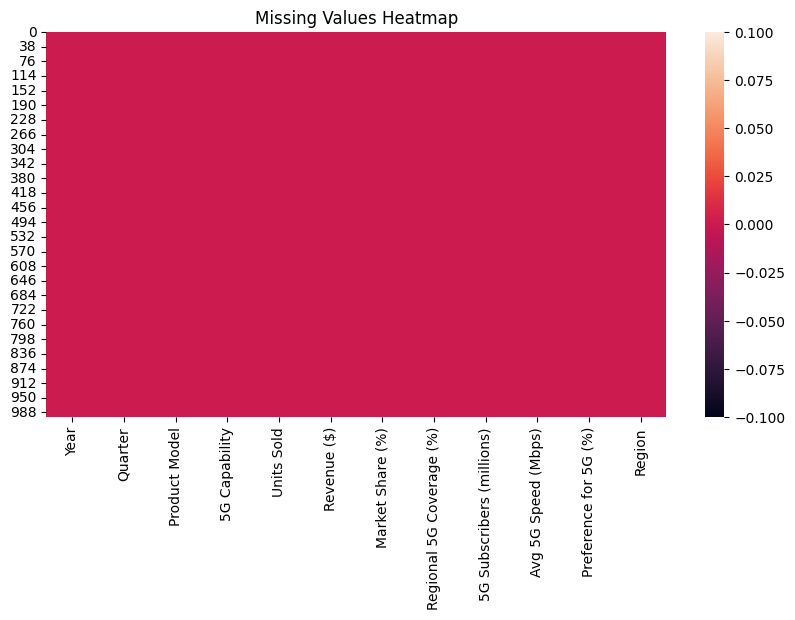

In [18]:

plt.figure(figsize=(10, 5))
sns.heatmap(df.isnull(), cbar=True)
plt.title("Missing Values Heatmap")
plt.show()


In [19]:
df.describe(include="object")


,Quarter,Product Model,5G Capability,Region
count,1000,1000,1000,1000
unique,4,15,2,5
top,Q1,Galaxy S22 5G,Yes,North America
freq,256,79,666,226


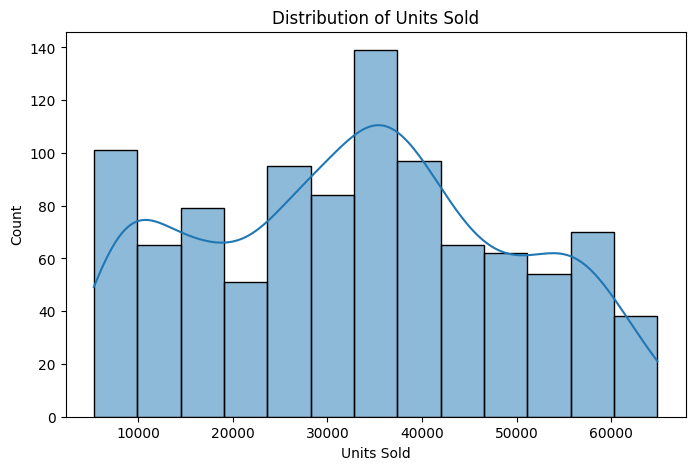

In [20]:
plt.figure(figsize=(8, 5))
sns.histplot(df["Units Sold"], kde=True)
plt.title("Distribution of Units Sold")
plt.show()


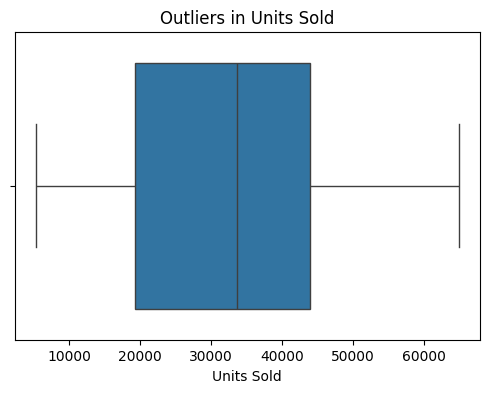

In [21]:
plt.figure(figsize=(6, 4))
sns.boxplot(x=df["Units Sold"])
plt.title("Outliers in Units Sold")
plt.show()


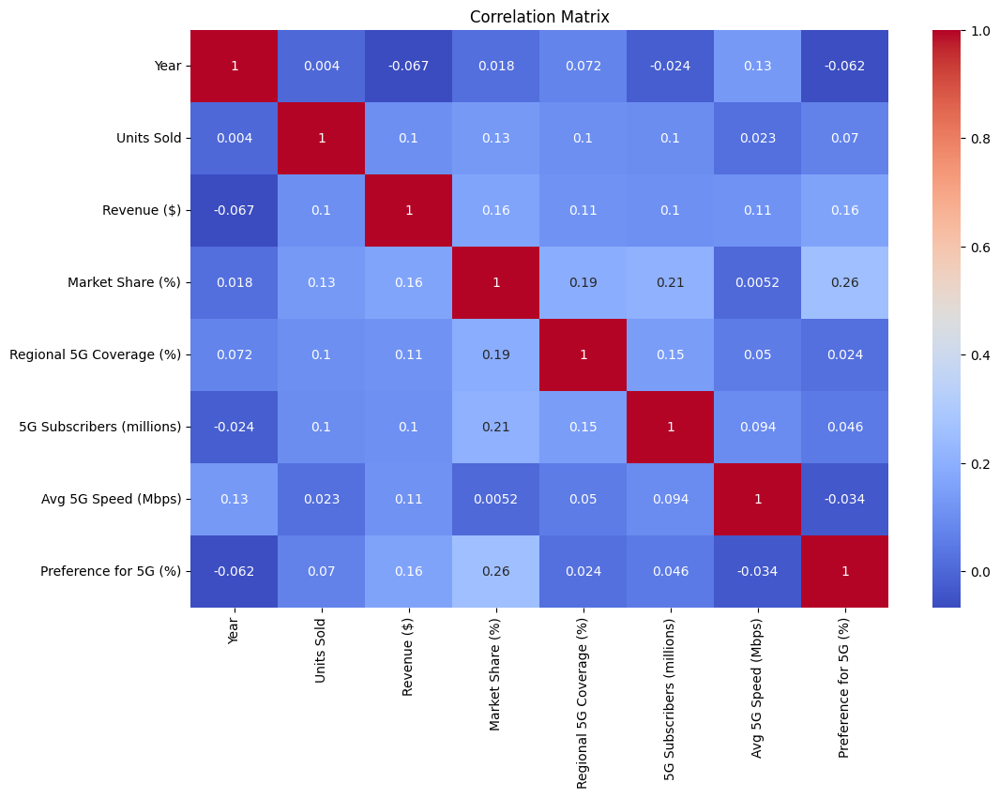

In [22]:
num_cols = df.select_dtypes(include=["int64", "float64"]).columns

plt.figure(figsize=(12, 8))
sns.heatmap(df[num_cols].corr(), annot=True, cmap="coolwarm")
plt.title("Correlation Matrix")
plt.show()


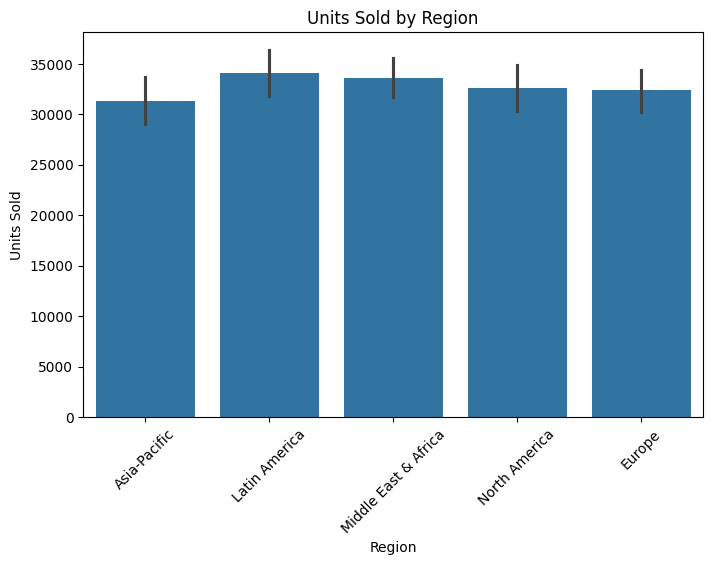

In [23]:
plt.figure(figsize=(8, 5))
sns.barplot(x="Region", y="Units Sold", data=df)
plt.xticks(rotation=45)
plt.title("Units Sold by Region")
plt.show()


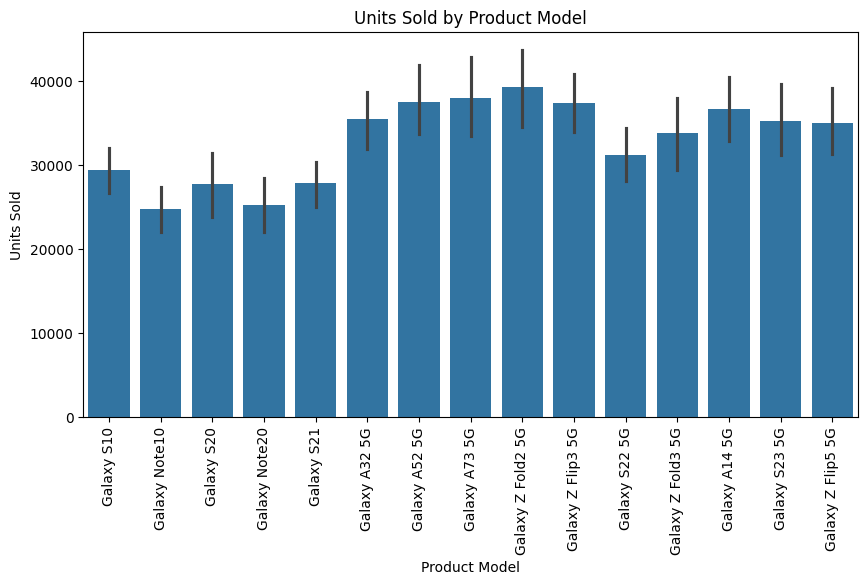

In [26]:
plt.figure(figsize=(10, 5))
sns.barplot(x="Product Model", y="Units Sold", data=df)
plt.xticks(rotation=90)
plt.title("Units Sold by Product Model")
plt.show()


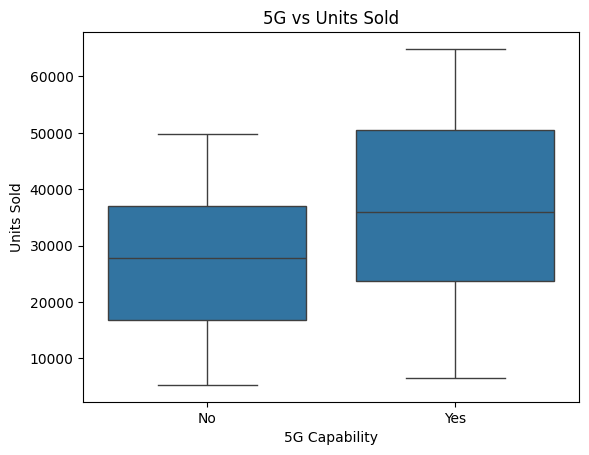

In [27]:
sns.boxplot(x="5G Capability", y="Units Sold", data=df)
plt.title("5G vs Units Sold")
plt.show()


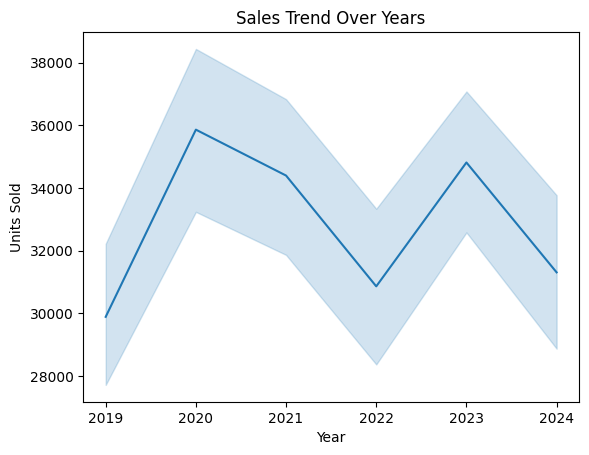

In [28]:
sns.lineplot(x="Year", y="Units Sold", data=df)
plt.title("Sales Trend Over Years")
plt.show()


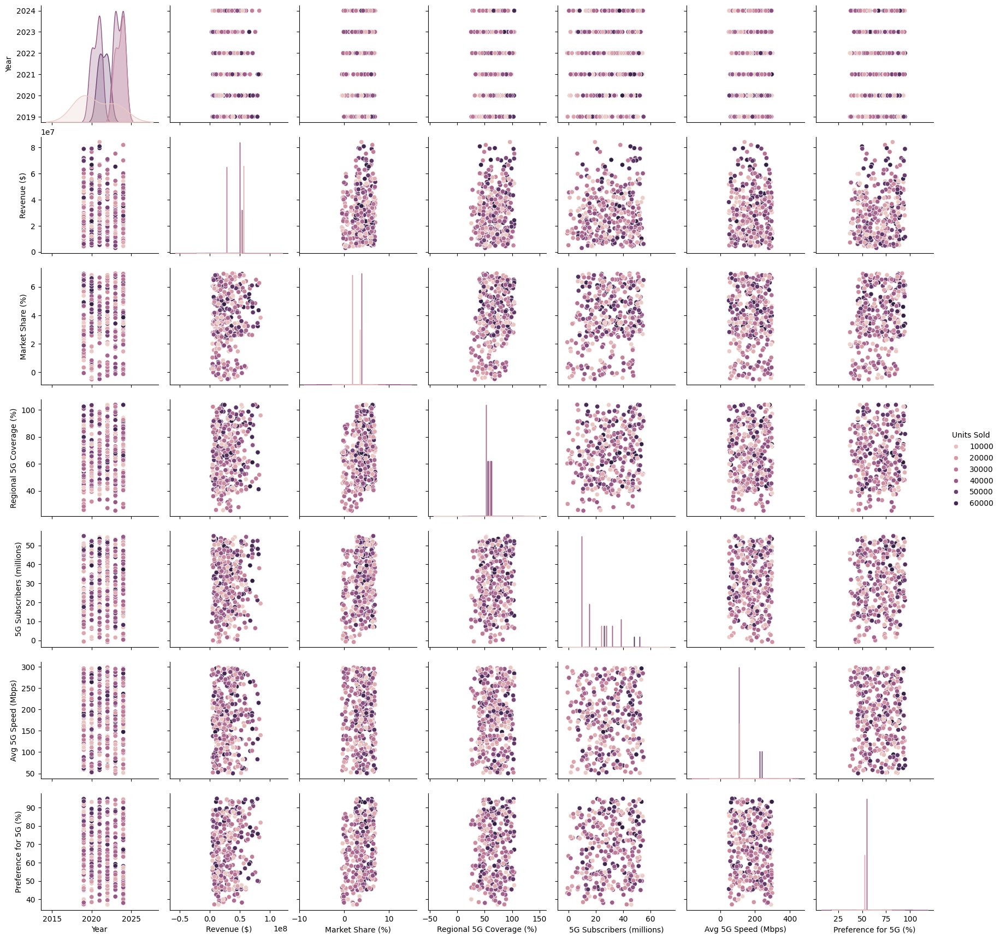

In [ ]:
sns.pairplot(df[num_cols], hue="Units Sold")
plt.show()

<h1 style="color:orange;">Data Preprocessing + Feature Engineering</h1>

In [38]:
cat_cols

Index(['Quarter', 'Product Model', '5G Capability', 'Region'], dtype='object')

In [3]:
df = df.drop("Revenue ($)", axis=1)


In [4]:
df

,Year,Quarter,Product Model,5G Capability,Units Sold,Market Share (%),Regional 5G Coverage (%),5G Subscribers (millions),Avg 5G Speed (Mbps),Preference for 5G (%),Region
0,2019,Q1,Galaxy S10,No,26396,1.04,57.36,39.55,293.10,55.87,Asia-Pacific
1,2019,Q1,Galaxy Note10,No,25671,2.82,85.80,42.58,67.46,37.26,Latin America
2,2019,Q1,Galaxy S20,No,16573,-0.03,47.02,3.78,77.25,84.66,Middle East & Africa
3,2019,Q1,Galaxy Note20,No,7177,0.84,25.70,23.41,105.27,40.03,North America
4,2019,Q1,Galaxy S21,No,45633,2.36,89.13,44.43,206.17,76.88,Latin America
...,...,...,...,...,...,...,...,...,...,...,...
995,2023,Q4,Galaxy S22 5G,Yes,36216,3.82,70.59,46.92,177.43,63.86,Latin America
996,2022,Q2,Galaxy S21,No,33806,-0.23,77.31,47.51,129.70,78.41,North America
997,2022,Q1,Galaxy S10,No,23678,0.58,45.61,43.79,156.56,72.06,Europe
998,2023,Q4,Galaxy Note10,No,35697,2.49,36.55,36.44,236.39,47.11,North America


In [11]:
encoder = OrdinalEncoder()
df['Quarter'] = encoder.fit_transform(df[['Quarter']])

In [9]:
encoder1 = OneHotEncoder(sparse_output=False)
df["Product Model"] = encoder1.fit_transform(df[['Product Model']])
df

,Year,Quarter,Product Model,5G Capability,Units Sold,Market Share (%),Regional 5G Coverage (%),5G Subscribers (millions),Avg 5G Speed (Mbps),Preference for 5G (%),Region
0,2019,Q1,0.0,0.0,26396,1.04,57.36,39.55,293.10,55.87,1.0
1,2019,Q1,0.0,0.0,25671,2.82,85.80,42.58,67.46,37.26,0.0
2,2019,Q1,0.0,0.0,16573,-0.03,47.02,3.78,77.25,84.66,0.0
3,2019,Q1,0.0,0.0,7177,0.84,25.70,23.41,105.27,40.03,0.0
4,2019,Q1,0.0,0.0,45633,2.36,89.13,44.43,206.17,76.88,0.0
...,...,...,...,...,...,...,...,...,...,...,...
995,2023,Q4,0.0,1.0,36216,3.82,70.59,46.92,177.43,63.86,0.0
996,2022,Q2,0.0,0.0,33806,-0.23,77.31,47.51,129.70,78.41,0.0
997,2022,Q1,0.0,0.0,23678,0.58,45.61,43.79,156.56,72.06,0.0
998,2023,Q4,0.0,0.0,35697,2.49,36.55,36.44,236.39,47.11,0.0


In [12]:
df

,Year,Quarter,Product Model,5G Capability,Units Sold,Market Share (%),Regional 5G Coverage (%),5G Subscribers (millions),Avg 5G Speed (Mbps),Preference for 5G (%),Region
0,2019,0.0,0.0,0.0,26396,1.04,57.36,39.55,293.10,55.87,1.0
1,2019,0.0,0.0,0.0,25671,2.82,85.80,42.58,67.46,37.26,0.0
2,2019,0.0,0.0,0.0,16573,-0.03,47.02,3.78,77.25,84.66,0.0
3,2019,0.0,0.0,0.0,7177,0.84,25.70,23.41,105.27,40.03,0.0
4,2019,0.0,0.0,0.0,45633,2.36,89.13,44.43,206.17,76.88,0.0
...,...,...,...,...,...,...,...,...,...,...,...
995,2023,3.0,0.0,1.0,36216,3.82,70.59,46.92,177.43,63.86,0.0
996,2022,1.0,0.0,0.0,33806,-0.23,77.31,47.51,129.70,78.41,0.0
997,2022,0.0,0.0,0.0,23678,0.58,45.61,43.79,156.56,72.06,0.0
998,2023,3.0,0.0,0.0,35697,2.49,36.55,36.44,236.39,47.11,0.0


In [7]:
df.describe()

,Year,5G Capability,Units Sold,Market Share (%),Regional 5G Coverage (%),5G Subscribers (millions),Avg 5G Speed (Mbps),Preference for 5G (%),Region
count,1000.000000,1000.00000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.00000,1000.00000
mean,2021.456000,0.19200,32842.990000,3.723570,66.889720,30.152080,179.225560,67.14291,0.17700
std,1.700281,0.39407,16039.770572,1.991108,19.254095,14.537781,70.470934,15.75925,0.38186
min,2019.000000,0.00000,5309.000000,-0.490000,25.340000,-0.890000,50.370000,37.14000,0.00000
25%,2020.000000,0.00000,19327.250000,2.635000,50.400000,18.412500,120.410000,53.26750,0.00000
50%,2021.000000,0.00000,33689.000000,3.760000,67.050000,29.915000,177.390000,66.96000,0.00000
75%,2023.000000,0.00000,43911.000000,5.282500,83.210000,44.360000,238.860000,80.99000,0.00000
max,2024.000000,1.00000,64883.000000,6.950000,103.920000,54.940000,298.700000,94.84000,1.00000


In [13]:
x  = df.drop(columns=['Units Sold'])

In [14]:
y = df["Units Sold"]

In [15]:
x_train , x_test , y_train,y_test = train_test_split(x , y , test_size=0.2,random_state=42)

In [16]:
scaler = StandardScaler()
x_train_data = scaler.fit_transform(x_train)
x_test_data = scaler.fit_transform(x_test)

using for the pearson corrleation and sequential feature selector method

In [17]:
model0 = LogisticRegression()

In [66]:
fs = SequentialFeatureSelector(model0, n_features_to_select="auto", direction="forward")
fs.fit(x, y)


,estimator,LogisticRegression()
,n_features_to_select,'auto'
,tol,None
,direction,'forward'
,scoring,None
,cv,5
,n_jobs,None
,penalty,'l2'
,dual,False
,tol,0.0001
,C,1.0


In [67]:
fs.feature_names_in_

array(['Year', 'Quarter', 'Product Model', '5G Capability',
       'Market Share (%)', 'Regional 5G Coverage (%)',
       '5G Subscribers (millions)', 'Avg 5G Speed (Mbps)',
       'Preference for 5G (%)', 'Region'], dtype=object)

In [68]:
fs.get_feature_names_out()

array(['Market Share (%)', 'Regional 5G Coverage (%)',
       '5G Subscribers (millions)', 'Avg 5G Speed (Mbps)',
       'Preference for 5G (%)'], dtype=object)

In [18]:


x = df[
    [
        "Market Share (%)",
        "Regional 5G Coverage (%)",
        "5G Subscribers (millions)",
        "Avg 5G Speed (Mbps)",
        "Preference for 5G (%)",
    ]
]

y = df["Units Sold"]

x_train, x_test, y_train, y_test = train_test_split(
    x, y, test_size=0.2, random_state=42
)

scaler = StandardScaler()

X_train_scaled = scaler.fit_transform(x_train)
X_test_scaled = scaler.transform(x_test)


In [28]:
selected_features = df[
    [
        "Market Share (%)",
        "Regional 5G Coverage (%)",
        "5G Subscribers (millions)",
        "Avg 5G Speed (Mbps)",
        "Preference for 5G (%)",
    ]
]
X_selected = selected_features  # DataFrame
y = df["Units Sold"]

In [ ]:
df = pd.concat([X_selected, y], axis=1)


In [30]:
df

,Market Share (%),Regional 5G Coverage (%),5G Subscribers (millions),Avg 5G Speed (Mbps),Preference for 5G (%),Units Sold
0,1.04,57.36,39.55,293.10,55.87,26396
1,2.82,85.80,42.58,67.46,37.26,25671
2,-0.03,47.02,3.78,77.25,84.66,16573
3,0.84,25.70,23.41,105.27,40.03,7177
4,2.36,89.13,44.43,206.17,76.88,45633
...,...,...,...,...,...,...
995,3.82,70.59,46.92,177.43,63.86,36216
996,-0.23,77.31,47.51,129.70,78.41,33806
997,0.58,45.61,43.79,156.56,72.06,23678
998,2.49,36.55,36.44,236.39,47.11,35697


### pearson corrleation meathod

In [ ]:
corr_matrix = df.corr()

corr_with_target = corr_matrix["Outcome"].sort_values(ascending=False)

print(corr_with_target)
top_features = corr_with_target.index[1:5] 
X_selected = df[top_features]


In [54]:
from lightgbm import LGBMRegressor
models = {
    "Ridge": {"model": Ridge(), "params": {"alpha": [0.01, 0.1, 1, 10, 100]}},
    "Lasso": {"model": Lasso(), "params": {"alpha": [0.001, 0.01, 0.1, 1]}},
    "Random Forest": {
        "model": RandomForestRegressor(random_state=42),
        "params": {
            "n_estimators": [200, 300, 500],
            "max_depth": [None, 5, 10],
            "min_samples_split": [2, 5],
            "min_samples_leaf": [1, 2],
        },
    },
    "Gradient Boosting": {
        "model": GradientBoostingRegressor(),
        "params": {
            "n_estimators": [100, 200],
            "learning_rate": [0.01, 0.05, 0.1],
            "max_depth": [3, 5],
        },
    },
    "XGBoost": {
        "model": XGBRegressor(objective="reg:squarederror"),
        "params": {
            "n_estimators": [300, 500],
            "learning_rate": [0.01, 0.05, 0.1],
            "max_depth": [3, 5, 7],
            "subsample": [0.7, 0.8, 1.0],
            "colsample_bytree": [0.7, 0.8, 1.0],
        },
    },
    "SVR": {
        "model": SVR(),
        "params": {"C": [0.1, 1, 10], "epsilon": [0.01, 0.1, 1], "kernel": ["rbf"]},
    },
}


In [59]:
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error
import numpy as np

for name, mp in models.items():
    model = mp["model"]  

    model.fit(X_train_scaled, y_train)
    y_pred = model.predict(X_test_scaled)

    print("Model:", name)
    print("R2 Score:", r2_score(y_test, y_pred))
    print("MAE:", mean_absolute_error(y_test, y_pred))
    print("MSE:", np.sqrt(mean_squared_error(y_test, y_pred)))
    print("RMSE:", np.sqrt(mean_squared_error(y_test, y_pred)))

    print("-" * 40)

Model: Ridge
R2 Score: 0.03497218638178645
MAE: 13277.84505184533
MSE: 15955.85468900178
RMSE: 15955.85468900178
----------------------------------------
Model: Lasso
R2 Score: 0.03495685993561315
MAE: 13278.053533770379
MSE: 15955.981392902762
RMSE: 15955.981392902762
----------------------------------------
Model: Random Forest
R2 Score: 0.7566908180550289
MAE: 4895.5489
MSE: 8011.787217624604
RMSE: 8011.787217624604
----------------------------------------
Model: Gradient Boosting
R2 Score: 0.38953560787607444
MAE: 9913.899147923303
MSE: 12690.546527887573
RMSE: 12690.546527887573
----------------------------------------
Model: XGBoost
R2 Score: 0.77019202709198
MAE: 2593.60888671875
MSE: 7786.328017750087
RMSE: 7786.328017750087
----------------------------------------
Model: SVR
R2 Score: 9.959211720078631e-05
MAE: 13249.880899709276
MSE: 16241.589512181326
RMSE: 16241.589512181326
----------------------------------------
